<a href="https://colab.research.google.com/github/kritikawin/DataHeroes/blob/master/wids2024_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install optuna
!pip install category_encoders
!pip install catboost

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import optuna
from category_encoders import OneHotEncoder, MEstimateEncoder, CatBoostEncoder, OrdinalEncoder
from sklearn import set_config
import category_encoders
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, clone
from sklearn.preprocessing import FunctionTransformer,StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.metrics import auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier, Pool

In [ ]:
train = pd.read_csv(r'/content/training.csv', index_col='patient_id')
test = pd.read_csv(r'/content/test.csv', index_col='patient_id')
sub  = pd.read_csv(r'/content/sample_submission.csv')

In [ ]:
train.head(3)

,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,,,,,,,
475714,NaN,MEDICAID,CA,924,84,F,NaN,C50919,Malignant neoplasm of unsp site of unspecified...,C7989,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
349367,White,COMMERCIAL,CA,928,62,F,28.49,C50411,Malig neoplm of upper-outer quadrant of right ...,C773,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
138632,White,COMMERCIAL,TX,760,43,F,38.09,C50112,Malignant neoplasm of central portion of left ...,C773,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1


In [ ]:
test.head(3)

,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,...,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
patient_id,,,,,,,,,,,,,,,,,,,,,
573710,White,MEDICAID,IN,467,54,F,NaN,C50412,Malig neoplasm of upper-outer quadrant of left...,C773,...,3.564516,13.996774,7.985484,0.969355,24.955357,10.838710,8.080645,38.724876,7.947165,11.157161
593679,NaN,COMMERCIAL,FL,337,52,F,NaN,C50912,Malignant neoplasm of unspecified site of left...,C787,...,10.261538,16.020513,13.602564,2.836842,23.952632,10.579487,9.302564,36.918257,7.838973,13.599985
184532,Hispanic,MEDICAID,CA,917,61,F,NaN,C50911,Malignant neoplasm of unsp site of right femal...,C773,...,47.726087,9.895652,10.515217,12.745652,32.530435,7.263043,3.810870,47.310325,9.595719,20.084231


In [ ]:
def create_stats(dataframe):
  desc = pd.DataFrame(index = list(dataframe))
  desc['type'] = dataframe.dtypes
  desc['count'] = dataframe.count()
  desc['nunique'] = dataframe.nunique()
  desc['%unique'] = desc['nunique'] /len(dataframe) * 100
  desc['null'] = dataframe.isnull().sum()
  desc['%null'] = desc['null'] / len(dataframe) * 100
  desc = pd.concat([desc,dataframe.describe().T.drop('count',axis=1)],axis=1)
  return desc.sort_values(by=['type','null']).style.background_gradient(axis=0)

In [ ]:
create_stats(train)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,12906,739,5.726019,0,0.000000,573.754300,275.447534,101.000000,331.000000,554.000000,846.000000,999.000000
patient_age,int64,12906,67,0.519138,0,0.000000,59.183326,13.335216,18.000000,50.000000,59.000000,67.000000,91.000000
DiagPeriodL90D,int64,12906,2,0.015497,0,0.000000,0.624516,0.484266,0.000000,0.000000,1.000000,1.000000,1.000000
population,float64,12905,738,5.718271,1,0.007748,20744.441237,13886.903756,635.545455,9463.896552,19154.190480,30021.278690,71374.131580
density,float64,12905,738,5.718271,1,0.007748,1581.950419,2966.305306,0.916667,171.857143,700.337500,1666.515385,21172.000000
age_median,float64,12905,728,5.640787,1,0.007748,40.502259,4.036963,20.600000,37.129825,40.639344,42.934783,54.570000
age_under_10,float64,12905,718,5.563304,1,0.007748,11.122784,1.512376,0.000000,10.160000,11.039216,12.190000,17.675000
age_10_to_19,float64,12905,725,5.617542,1,0.007748,12.945265,1.923974,6.314286,11.741176,12.923944,14.019767,35.300000
age_20s,float64,12905,724,5.609794,1,0.007748,13.290376,3.354103,5.925000,11.013415,12.538095,14.971053,62.100000
age_30s,float64,12905,725,5.617542,1,0.007748,12.862036,2.324922,1.500000,11.292105,12.442647,14.026667,25.471429


In [ ]:
create_stats(test)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,5792,679,11.723066,0,0.000000,570.217887,275.314510,101.000000,329.000000,554.000000,836.000000,996.000000
patient_age,int64,5792,67,1.156768,0,0.000000,59.274862,13.076323,18.000000,50.000000,59.000000,67.000000,91.000000
population,float64,5792,679,11.723066,0,0.000000,20266.872152,13694.738314,829.515152,8863.550000,18711.016665,28996.772730,71374.131580
density,float64,5792,679,11.723066,0,0.000000,1510.471786,2883.409750,0.821739,161.925000,626.236667,1612.851111,21172.000000
age_median,float64,5792,670,11.567680,0,0.000000,40.575472,4.029852,20.600000,37.190476,40.640909,43.085938,54.570000
age_under_10,float64,5792,660,11.395028,0,0.000000,11.119250,1.478579,0.000000,10.160000,11.039216,12.143396,16.481818
age_10_to_19,float64,5792,668,11.533149,0,0.000000,12.919191,1.909698,6.314286,11.726471,12.923944,13.904830,35.300000
age_20s,float64,5792,667,11.515884,0,0.000000,13.218348,3.294389,5.925000,10.996226,12.531646,14.937500,62.100000
age_30s,float64,5792,668,11.533149,0,0.000000,12.841374,2.358636,1.500000,11.211818,12.404348,14.037838,25.471429
age_40s,float64,5792,657,11.343232,0,0.000000,12.063877,1.250266,0.800000,11.354237,12.118605,12.867171,17.820000


In [ ]:
drop_col = ["patient_race", "bmi", "metastatic_first_novel_treatment", "metastatic_first_novel_treatment_type", "patient_gender"]
train = train.drop(columns=drop_col)

In [ ]:
train.shape

(12906, 77)

In [ ]:
test = test.drop(columns=drop_col)

In [ ]:
test.shape

(5792, 76)

In [ ]:
train = train.fillna(value={"payer_type":"UNKNOWN"})
test = test.fillna(value={"payer_type":"UNKNOWN"})

In [ ]:
values = {"patient_state":"UNKNOWN", "Region":"UNKNOWN", "Division":"UNKNOWN"}
train = train.fillna(value=values)
test=test.fillna(value=values)

In [ ]:
create_stats(train)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,12906,739,5.726019,0,0.000000,573.754300,275.447534,101.000000,331.000000,554.000000,846.000000,999.000000
patient_age,int64,12906,67,0.519138,0,0.000000,59.183326,13.335216,18.000000,50.000000,59.000000,67.000000,91.000000
DiagPeriodL90D,int64,12906,2,0.015497,0,0.000000,0.624516,0.484266,0.000000,0.000000,1.000000,1.000000,1.000000
population,float64,12905,738,5.718271,1,0.007748,20744.441237,13886.903756,635.545455,9463.896552,19154.190480,30021.278690,71374.131580
density,float64,12905,738,5.718271,1,0.007748,1581.950419,2966.305306,0.916667,171.857143,700.337500,1666.515385,21172.000000
age_median,float64,12905,728,5.640787,1,0.007748,40.502259,4.036963,20.600000,37.129825,40.639344,42.934783,54.570000
age_under_10,float64,12905,718,5.563304,1,0.007748,11.122784,1.512376,0.000000,10.160000,11.039216,12.190000,17.675000
age_10_to_19,float64,12905,725,5.617542,1,0.007748,12.945265,1.923974,6.314286,11.741176,12.923944,14.019767,35.300000
age_20s,float64,12905,724,5.609794,1,0.007748,13.290376,3.354103,5.925000,11.013415,12.538095,14.971053,62.100000
age_30s,float64,12905,725,5.617542,1,0.007748,12.862036,2.324922,1.500000,11.292105,12.442647,14.026667,25.471429


In [ ]:
create_stats(test)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,5792,679,11.723066,0,0.000000,570.217887,275.314510,101.000000,329.000000,554.000000,836.000000,996.000000
patient_age,int64,5792,67,1.156768,0,0.000000,59.274862,13.076323,18.000000,50.000000,59.000000,67.000000,91.000000
population,float64,5792,679,11.723066,0,0.000000,20266.872152,13694.738314,829.515152,8863.550000,18711.016665,28996.772730,71374.131580
density,float64,5792,679,11.723066,0,0.000000,1510.471786,2883.409750,0.821739,161.925000,626.236667,1612.851111,21172.000000
age_median,float64,5792,670,11.567680,0,0.000000,40.575472,4.029852,20.600000,37.190476,40.640909,43.085938,54.570000
age_under_10,float64,5792,660,11.395028,0,0.000000,11.119250,1.478579,0.000000,10.160000,11.039216,12.143396,16.481818
age_10_to_19,float64,5792,668,11.533149,0,0.000000,12.919191,1.909698,6.314286,11.726471,12.923944,13.904830,35.300000
age_20s,float64,5792,667,11.515884,0,0.000000,13.218348,3.294389,5.925000,10.996226,12.531646,14.937500,62.100000
age_30s,float64,5792,668,11.533149,0,0.000000,12.841374,2.358636,1.500000,11.211818,12.404348,14.037838,25.471429
age_40s,float64,5792,657,11.343232,0,0.000000,12.063877,1.250266,0.800000,11.354237,12.118605,12.867171,17.820000


In [ ]:
train = train.dropna()

In [ ]:
create_stats(train)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,12873,731,5.678552,0,0.000000,572.826381,275.119971,101.000000,331.000000,554.000000,840.000000,994.000000
patient_age,int64,12873,67,0.520469,0,0.000000,59.189777,13.344952,18.000000,50.000000,59.000000,67.000000,91.000000
DiagPeriodL90D,int64,12873,2,0.015536,0,0.000000,0.624641,0.484234,0.000000,0.000000,1.000000,1.000000,1.000000
population,float64,12873,731,5.678552,0,0.000000,20762.491723,13895.041839,635.545455,9463.896552,19154.190480,30021.278690,71374.131580
density,float64,12873,731,5.678552,0,0.000000,1582.568503,2969.209379,0.916667,170.550000,700.337500,1666.515385,21172.000000
age_median,float64,12873,721,5.600870,0,0.000000,40.508753,4.026558,28.875000,37.129825,40.639344,42.934783,54.570000
age_under_10,float64,12873,711,5.523188,0,0.000000,11.128005,1.494934,5.218519,10.160000,11.039216,12.190000,17.675000
age_10_to_19,float64,12873,718,5.577565,0,0.000000,12.943554,1.893785,6.314286,11.741176,12.932609,14.021739,29.575000
age_20s,float64,12873,717,5.569797,0,0.000000,13.262173,3.198973,5.925000,11.024615,12.538095,14.971053,32.800000
age_30s,float64,12873,718,5.577565,0,0.000000,12.867835,2.319751,5.693333,11.292105,12.442647,14.026667,25.471429


In [ ]:
train['breast_cancer_diagnosis_desc'].value_counts()

Malignant neoplasm of breast (female), unspecified                  1980
Malignant neoplasm of unsp site of right female breast              1788
Malignant neoplasm of unspecified site of left female breast        1707
Malignant neoplasm of unsp site of unspecified female breast        1464
Malig neoplm of upper-outer quadrant of right female breast          977
Malig neoplasm of upper-outer quadrant of left female breast         875
Malignant neoplasm of ovrlp sites of right female breast             490
Malignant neoplasm of ovrlp sites of left female breast              415
Malignant neoplasm of upper-outer quadrant of female breast          386
Malignant neoplasm of other specified sites of female breast         306
Malig neoplasm of upper-inner quadrant of left female breast         293
Malig neoplm of upper-inner quadrant of right female breast          275
Malig neoplm of lower-outer quadrant of right female breast          213
Malignant neoplasm of central portion of left femal

In [ ]:
test['breast_cancer_diagnosis_desc'].value_counts()

Malignant neoplasm of breast (female), unspecified              906
Malignant neoplasm of unsp site of right female breast          817
Malignant neoplasm of unspecified site of left female breast    763
Malignant neoplasm of unsp site of unspecified female breast    652
Malig neoplm of upper-outer quadrant of right female breast     421
Malig neoplasm of upper-outer quadrant of left female breast    406
Malignant neoplasm of ovrlp sites of left female breast         194
Malignant neoplasm of ovrlp sites of right female breast        193
Malignant neoplasm of upper-outer quadrant of female breast     169
Malignant neoplasm of other specified sites of female breast    146
Malig neoplasm of upper-inner quadrant of left female breast    144
Malig neoplm of upper-inner quadrant of right female breast     120
Malignant neoplasm of central portion of left female breast     100
Malig neoplasm of lower-outer quadrant of left female breast     99
Malignant neoplasm of central portion of right f

In [ ]:
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace('Malig ', 'Malignant ', case=False)
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace('Malig ', 'Malignant ', case=False)

In [ ]:
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace('neoplm ', 'neoplasm ', case=False)
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace('neoplm ', 'neoplasm ', case=False)

In [ ]:
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace('unsp ', 'unspecified ', case=False)
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace('unsp ', 'unspecified ', case=False)

In [ ]:
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace('-', ' ', regex=True)  # Replace - with space
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace(r'\(|\)', ' ', regex=True)  # Replace ( or ) with space
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace(',', ' ', regex=True)  # Replace , with space

In [ ]:
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace('-', ' ', regex=True)  # Replace - with space
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace(r'\(|\)', ' ', regex=True)  # Replace ( or ) with space
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace(',', ' ', regex=True)  # Replace , with space

In [ ]:
train['breast_cancer_diagnosis_desc'] = train['breast_cancer_diagnosis_desc'].str.replace('  ', ' ', case=False)
test['breast_cancer_diagnosis_desc'] = test['breast_cancer_diagnosis_desc'].str.replace('  ', ' ', case=False)

In [ ]:
train['breast_cancer_diagnosis_desc'].value_counts()

Malignant neoplasm of breast female  unspecified                           1980
Malignant neoplasm of unspecified site of right female breast              1788
Malignant neoplasm of unspecified site of left female breast               1707
Malignant neoplasm of unspecified site of unspecified female breast        1464
Malignant neoplasm of upper outer quadrant of right female breast           977
Malignant neoplasm of upper outer quadrant of left female breast            875
Malignant neoplasm of ovrlp sites of right female breast                    490
Malignant neoplasm of ovrlp sites of left female breast                     415
Malignant neoplasm of upper outer quadrant of female breast                 386
Malignant neoplasm of other specified sites of female breast                306
Malignant neoplasm of upper inner quadrant of left female breast            293
Malignant neoplasm of upper inner quadrant of right female breast           275
Malignant neoplasm of lower outer quadra

In [ ]:
test['breast_cancer_diagnosis_desc'].value_counts()

Malignant neoplasm of breast female  unspecified                           906
Malignant neoplasm of unspecified site of right female breast              817
Malignant neoplasm of unspecified site of left female breast               763
Malignant neoplasm of unspecified site of unspecified female breast        652
Malignant neoplasm of upper outer quadrant of right female breast          421
Malignant neoplasm of upper outer quadrant of left female breast           406
Malignant neoplasm of ovrlp sites of left female breast                    194
Malignant neoplasm of ovrlp sites of right female breast                   193
Malignant neoplasm of upper outer quadrant of female breast                169
Malignant neoplasm of other specified sites of female breast               146
Malignant neoplasm of upper inner quadrant of left female breast           144
Malignant neoplasm of upper inner quadrant of right female breast          120
Malignant neoplasm of central portion of left female

In [ ]:
!pip install feature-engine

In [ ]:
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)

In [ ]:
X.shape

(12873, 76)

In [ ]:
y.shape

(12873,)

In [ ]:
X_test=test

In [ ]:
from feature_engine.encoding import MeanEncoder
me = MeanEncoder(variables=['breast_cancer_diagnosis_desc'])
me.fit(X,y)
X=me.transform(X)
X_test=me.transform(X_test)

/usr/local/lib/python3.10/dist-packages/feature_engine/encoding/base_encoder.py:255: UserWarning: During the encoding, NaN values were introduced in the feature(s) breast_cancer_diagnosis_desc.
  warnings.warn(


In [ ]:
X['breast_cancer_diagnosis_desc'].value_counts()

0.091414    1980
0.789150    1788
0.777387    1707
0.780738    1464
0.783009     977
0.796571     875
0.828571     490
0.795181     415
0.085492     386
0.101307     306
0.774744     293
0.745455     275
0.774648     213
0.760766     209
0.788462     208
0.795455     176
0.779874     159
0.797101     138
0.805556     108
0.819048     105
0.132653      98
0.103448      87
0.070423      71
0.740741      54
0.791667      48
0.702703      37
0.176471      34
0.724138      29
0.720000      25
0.875000      16
0.687500      16
1.000000      15
0.615385      13
0.250000      12
0.545455      11
0.636364      11
0.777778       9
0.111111       9
0.666667       3
0.000000       3
Name: breast_cancer_diagnosis_desc, dtype: int64

In [ ]:
from feature_engine.discretisation import ArbitraryDiscretiser
user_dict = {'breast_cancer_diagnosis_desc': [0.0, 0.3, 0.5, 0.7, 0.9, 1]}
transformer = ArbitraryDiscretiser(binning_dict=user_dict, return_object=False, return_boundaries=False)

In [ ]:
transformer.fit(X)

ArbitraryDiscretiser(binning_dict={'breast_cancer_diagnosis_desc': [0.0, 0.3,
                                                                    0.5, 0.7,
                                                                    0.9, 1]})

In [ ]:
X=transformer.transform(X)
X_test.fillna(X_test.breast_cancer_diagnosis_desc.median(),inplace=True)
X_test=transformer.transform(X_test)

In [ ]:
X['patient_age'] = X['patient_age'].astype('object')
X_test['patient_age'] = X_test['patient_age'].astype('object')

In [ ]:
from feature_engine.encoding import MeanEncoder
me = MeanEncoder(variables=['patient_age'])
me.fit(X,y)
X=me.transform(X)
X_test=me.transform(X_test)

In [ ]:
from feature_engine.discretisation import ArbitraryDiscretiser
user_dict = {'patient_age': [0.0, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 1]}

In [ ]:
transformer = ArbitraryDiscretiser(binning_dict=user_dict, return_object=False, return_boundaries=False)

In [ ]:
transformer.fit(X)

ArbitraryDiscretiser(binning_dict={'patient_age': [0.0, 0.5, 0.6, 0.7, 0.8,
                                                   0.85, 0.9, 1]})

In [ ]:
X=transformer.transform(X)
X_test=transformer.transform(X_test)

In [ ]:
X['breast_cancer_diagnosis_code'] = X['breast_cancer_diagnosis_code'].str.extract('(\d+)').astype(int)
X_test['breast_cancer_diagnosis_code'] = X_test['breast_cancer_diagnosis_code'].str.extract('(\d+)').astype(int)

In [ ]:
X['breast_cancer_diagnosis_code'] = X['breast_cancer_diagnosis_code'].astype('object')
X_test['breast_cancer_diagnosis_code'] = X_test['breast_cancer_diagnosis_code'].astype('object')

In [ ]:
from feature_engine.encoding import MeanEncoder
me = MeanEncoder(variables=['breast_cancer_diagnosis_code'])
me.fit(X,y)
X=me.transform(X)
X_test=me.transform(X_test)

/usr/local/lib/python3.10/dist-packages/feature_engine/encoding/base_encoder.py:255: UserWarning: During the encoding, NaN values were introduced in the feature(s) breast_cancer_diagnosis_code.
  warnings.warn(


In [ ]:
from feature_engine.discretisation import ArbitraryDiscretiser
user_dict = {'breast_cancer_diagnosis_code': [0.0, 0.1, 0.2, 0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 1]}
transformer = ArbitraryDiscretiser(binning_dict=user_dict, return_object=False, return_boundaries=False)

In [ ]:
transformer.fit(X)

ArbitraryDiscretiser(binning_dict={'breast_cancer_diagnosis_code': [0.0, 0.1,
                                                                    0.2, 0.5,
                                                                    0.6, 0.7,
                                                                    0.75, 0.8,
                                                                    0.85, 1]})

In [ ]:
X=transformer.transform(X)
X_test.fillna(X_test.breast_cancer_diagnosis_code.median(),inplace=True)
X_test=transformer.transform(X_test)

In [ ]:
X['metastatic_cancer_diagnosis_code'] = X['metastatic_cancer_diagnosis_code'].str.extract('(\d+)').astype(int)
X_test['metastatic_cancer_diagnosis_code'] = X_test['metastatic_cancer_diagnosis_code'].str.extract('(\d+)').astype(int)
X['metastatic_cancer_diagnosis_code'] = X['metastatic_cancer_diagnosis_code'].astype('object')
X_test['metastatic_cancer_diagnosis_code'] = X_test['metastatic_cancer_diagnosis_code'].astype('object')
from feature_engine.encoding import MeanEncoder
me = MeanEncoder(variables=['metastatic_cancer_diagnosis_code'])
me.fit(X,y)
X=me.transform(X)
X_test=me.transform(X_test)

In [ ]:
X.metastatic_cancer_diagnosis_code.value_counts()

0.669178    7034
0.564981    1839
0.552493     762
0.416309     466
0.599022     409
0.645429     361
0.593023     344
0.588652     282
0.646429     280
0.560241     166
0.589744     156
0.691275     149
0.539683     126
0.587500      80
0.519481      77
0.589041      73
0.627907      43
0.406250      32
0.516129      31
0.703704      27
0.750000      20
0.800000      20
0.437500      16
0.812500      16
0.714286      14
1.000000      14
0.538462      13
0.416667      12
0.000000       6
0.666667       3
0.500000       2
Name: metastatic_cancer_diagnosis_code, dtype: int64

In [ ]:
from feature_engine.discretisation import ArbitraryDiscretiser
user_dict = {'metastatic_cancer_diagnosis_code': [0.0, 0.4, 0.55, 0.6, 0.7, 0.8, 0.85, 1]}
transformer = ArbitraryDiscretiser(binning_dict=user_dict, return_object=False, return_boundaries=False)

In [ ]:
transformer.fit(X)
X=transformer.transform(X)
X_test=transformer.transform(X_test)

In [ ]:
create_stats(X)


,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_zip3,int64,12873,731,5.678552,0,0.000000,572.826381,275.119971,101.000000,331.000000,554.000000,840.000000,994.000000
patient_age,int64,12873,7,0.054377,0,0.000000,1.930086,1.009167,0.000000,1.000000,2.000000,2.000000,6.000000
breast_cancer_diagnosis_code,int64,12873,9,0.069914,0,0.000000,4.669152,2.494555,0.000000,5.000000,6.000000,6.000000,8.000000
breast_cancer_diagnosis_desc,int64,12873,4,0.031073,0,0.000000,2.301095,1.266745,0.000000,3.000000,3.000000,3.000000,4.000000
metastatic_cancer_diagnosis_code,int64,12873,7,0.054377,0,0.000000,2.570885,0.633485,0.000000,2.000000,3.000000,3.000000,6.000000
population,float64,12873,731,5.678552,0,0.000000,20762.491723,13895.041839,635.545455,9463.896552,19154.190480,30021.278690,71374.131580
density,float64,12873,731,5.678552,0,0.000000,1582.568503,2969.209379,0.916667,170.550000,700.337500,1666.515385,21172.000000
age_median,float64,12873,721,5.600870,0,0.000000,40.508753,4.026558,28.875000,37.129825,40.639344,42.934783,54.570000
age_under_10,float64,12873,711,5.523188,0,0.000000,11.128005,1.494934,5.218519,10.160000,11.039216,12.190000,17.675000
age_10_to_19,float64,12873,718,5.577565,0,0.000000,12.943554,1.893785,6.314286,11.741176,12.932609,14.021739,29.575000


In [ ]:
from feature_engine.encoding import OneHotEncoder
ohe = OneHotEncoder(drop_last=True,variables=['payer_type','Region'])
ohe.fit(X)
X=ohe.transform(X)
X_test=ohe.transform(X_test)

In [ ]:
X.shape

(12873, 81)

In [ ]:
X_test.shape

(5792, 81)

In [ ]:
y.shape

(12873,)

In [ ]:
X=pd.concat([X,y],axis=1)

In [ ]:
X.shape

(12873, 82)

In [ ]:
train=X
test=X_test

In [ ]:
train.to_csv('train_FE_11022024.csv',index=False)
test.to_csv('test_FE_11022024.csv',index=False)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from feature_engine.selection import SelectByTargetMeanPerformance
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)
tmp = SelectByTargetMeanPerformance(bins = 5, cv=5,scoring='roc_auc',regression=False)
tmp.fit_transform(X, y)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'TargetMeanClassifier' object has no attribute 'decision_function'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    retur

,patient_state,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,Division,age_30s,age_40s,income_household_25_to_35,income_household_75_to_100,rent_median,PM25,payer_type_COMMERCIAL,Region_West
patient_id,,,,,,,,,,,,,,,
475714,CA,924,5,6,3,2,Pacific,14.014286,11.614286,10.142857,12.742857,1165.000000,8.650555,0,1
349367,CA,928,2,6,3,3,Pacific,13.418182,13.333333,5.163636,12.469697,2003.125000,8.487175,1,1
138632,TX,760,1,6,3,3,West South Central,13.545000,12.860000,6.763333,13.560000,1235.907407,7.642753,1,0
617843,CA,926,2,6,3,3,Pacific,12.464286,12.650000,4.380952,10.721429,2354.738095,7.229393,1,1
817482,ID,836,2,0,0,3,Mountain,10.364000,12.600000,11.462000,12.480000,919.743590,4.110749,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674178,OH,436,2,6,3,3,East North Central,12.705882,11.694118,10.364706,11.047059,772.647059,8.068682,0,0
452909,CA,945,2,6,3,3,Pacific,13.101235,12.817284,5.148750,11.286250,2223.445946,6.265266,1,1
357486,CA,926,2,6,3,3,Pacific,12.464286,12.650000,4.380952,10.721429,2354.738095,7.229393,1,1


In [ ]:
tmp.feature_performance_

{'patient_state': nan,
 'patient_zip3': 0.5211497135720752,
 'patient_age': 0.5887248985031077,
 'breast_cancer_diagnosis_code': 0.7674058466839926,
 'breast_cancer_diagnosis_desc': 0.7637515854988453,
 'metastatic_cancer_diagnosis_code': 0.5651255475791032,
 'Division': 0.5297769867734494,
 'population': 0.5109468405526881,
 'density': 0.5014740574783627,
 'age_median': 0.5002758904850886,
 'age_under_10': 0.49844895293596236,
 'age_10_to_19': 0.5073728587789721,
 'age_20s': 0.49799273647022213,
 'age_30s': 0.5156345053373461,
 'age_40s': 0.5223068560993116,
 'age_50s': 0.4906851875708558,
 'age_60s': 0.5137536582076734,
 'age_70s': 0.49457562887026507,
 'age_over_80': 0.49600089986031703,
 'male': 0.5002300230635008,
 'female': 0.5002300230635008,
 'married': 0.5100958994282141,
 'divorced': 0.5001877757168641,
 'never_married': 0.4986339764906374,
 'widowed': 0.5126854479369353,
 'family_size': 0.5125691634219656,
 'family_dual_income': 0.5142767707101573,
 'income_household_median'

In [ ]:
cat_cols = train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = train.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols.remove('DiagPeriodL90D')

In [ ]:
num_cols

['patient_zip3',
 'patient_age',
 'breast_cancer_diagnosis_code',
 'breast_cancer_diagnosis_desc',
 'metastatic_cancer_diagnosis_code',
 'population',
 'density',
 'age_median',
 'age_under_10',
 'age_10_to_19',
 'age_20s',
 'age_30s',
 'age_40s',
 'age_50s',
 'age_60s',
 'age_70s',
 'age_over_80',
 'male',
 'female',
 'married',
 'divorced',
 'never_married',
 'widowed',
 'family_size',
 'family_dual_income',
 'income_household_median',
 'income_household_under_5',
 'income_household_5_to_10',
 'income_household_10_to_15',
 'income_household_15_to_20',
 'income_household_20_to_25',
 'income_household_25_to_35',
 'income_household_35_to_50',
 'income_household_50_to_75',
 'income_household_75_to_100',
 'income_household_100_to_150',
 'income_household_150_over',
 'income_household_six_figure',
 'income_individual_median',
 'home_ownership',
 'housing_units',
 'home_value',
 'rent_median',
 'rent_burden',
 'education_less_highschool',
 'education_highschool',
 'education_some_college',


In [ ]:
cat_cols

['patient_state', 'Division']

In [ ]:
n_features = len(num_cols)
n_cols = 6  # The number of columns you want
n_rows = n_features // n_cols + (n_features % n_cols > 0)  # This will round up the division

fig, ax = plt.subplots(n_rows, n_cols, figsize=(25,25), dpi=300)
ax = ax.flatten()
for i, col in enumerate(num_cols):
    sns.kdeplot(train[col],ax=ax[i],color='b')
    sns.kdeplot(test[col],ax=ax[i],color='g')
    ax[i].set_title(f'{col}')
    ax[i].set_xlabel(None)

for j in range(len(num_cols),len(ax)):
    ax[j].axis('off')
fig.suptitle('Distribution of Feature\nper Dataset\n', fontsize = 24, fontweight = 'bold')
fig.legend(['Train', 'Test'])
plt.tight_layout(h_pad=0.1, w_pad=0.5)
plt.show()

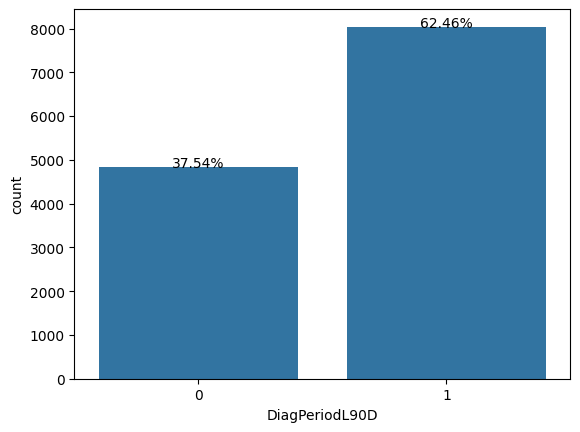

In [ ]:
ax = sns.countplot(x=train['DiagPeriodL90D'])

total = len(train['DiagPeriodL90D'])
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 0.1,
            '{:.2%}'.format(height / total),
            ha="center")
plt.show()

<ipython-input-68-afdcfe9eeccd>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
<ipython-input-68-afdcfe9eeccd>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')


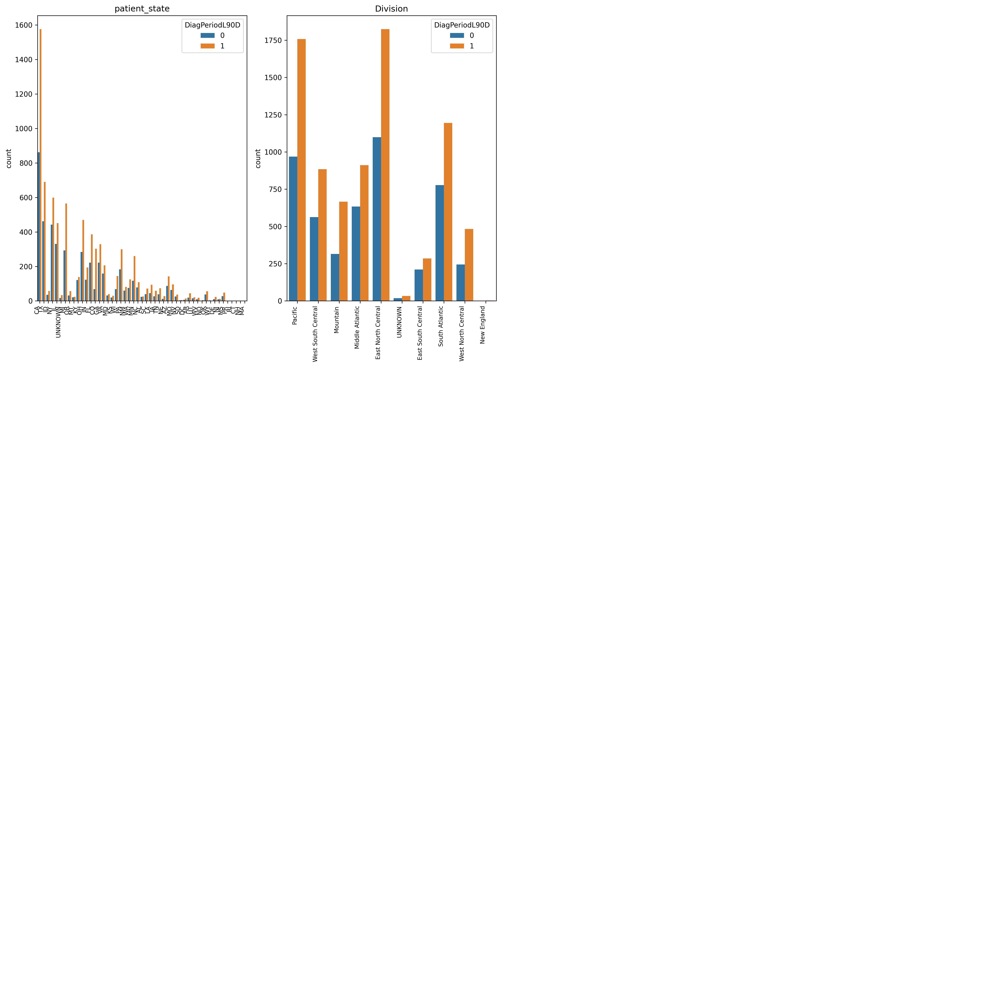

In [ ]:
target = 'DiagPeriodL90D'
fig, ax = plt.subplots(3,4, figsize=(20,20), dpi=300)
ax = ax.flatten()
plt.subplots_adjust(wspace=0.3, hspace=0.2)
for i, col in enumerate(cat_cols):
    sns.countplot(x=train[col],hue=train[target],ax=ax[i])
    ax[i].set_title(f'{col}')
    ax[i].set_xlabel(None)
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
for j in range(len(cat_cols),len(ax)):
    ax[j].axis('off')
plt.tight_layout(h_pad=0.1)
plt.show()

In [ ]:
count_class_1, count_class_0 = train['DiagPeriodL90D'].value_counts()

In [ ]:
# Divide by class
df_class_0 = train[train['DiagPeriodL90D'] == 0]
df_class_1 = train[train['DiagPeriodL90D'] == 1]

Random under-sampling:
0    8041
1    8041
Name: DiagPeriodL90D, dtype: int64


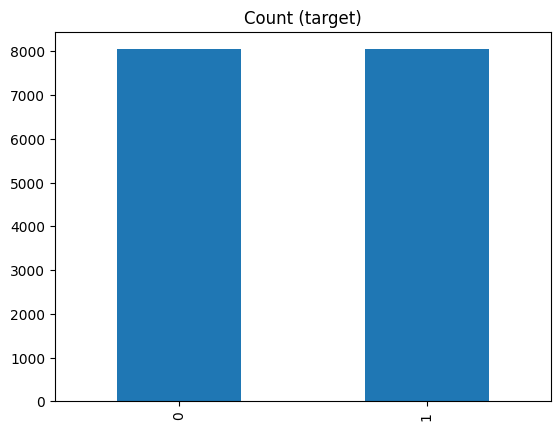

In [ ]:
df_class_0_over = df_class_0.sample(count_class_1, replace=True)
df_test_over = pd.concat([df_class_0_over, df_class_1], axis=0)

print('Random under-sampling:')
print(df_test_over['DiagPeriodL90D'].value_counts())

df_test_over['DiagPeriodL90D'].value_counts().plot(kind='bar', title='Count (target)');

In [ ]:
train = df_test_over
train.head()

,patient_state,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,Division,population,density,age_median,...,PM25,N02,payer_type_MEDICAID,payer_type_COMMERCIAL,payer_type_MEDICARE ADVANTAGE,Region_West,Region_South,Region_Northeast,Region_Midwest,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,,,,,,,
974142,CA,960,2,6,3,3,Pacific,4156.094595,21.060811,49.943662,...,3.473797,6.178929,0,1,0,1,0,0,0,0
974032,MN,564,2,6,3,3,West North Central,3849.256410,16.084615,47.676923,...,4.817198,10.113051,0,0,1,0,0,0,1,0
889831,NY,128,2,0,0,3,Middle Atlantic,3520.292308,80.715385,48.936508,...,4.424463,11.347575,0,0,1,0,0,1,0,0
838814,LA,701,1,0,0,2,West South Central,19259.090910,1774.104545,37.250000,...,8.811142,22.297642,0,0,0,0,1,0,0,0
878085,CA,933,1,6,3,2,Pacific,52872.090910,1028.072727,31.381818,...,11.086825,19.476779,0,1,0,1,0,0,0,0


In [ ]:
train.shape

(16082, 82)

In [ ]:
test.shape

(5792, 81)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in ["patient_state","Division"]:
    train[col] = le.fit_transform(train[col])
    test[col] = le.fit_transform(test[col])

In [ ]:
train.head()

,patient_state,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,Division,population,density,age_median,...,PM25,N02,payer_type_MEDICAID,payer_type_COMMERCIAL,payer_type_MEDICARE ADVANTAGE,Region_West,Region_South,Region_Northeast,Region_Midwest,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,,,,,,,
974142,3,960,2,6,3,3,5,4156.094595,21.060811,49.943662,...,3.473797,6.178929,0,1,0,1,0,0,0,0
974032,20,564,2,6,3,3,8,3849.256410,16.084615,47.676923,...,4.817198,10.113051,0,0,1,0,0,0,1,0
889831,31,128,2,0,0,3,2,3520.292308,80.715385,48.936508,...,4.424463,11.347575,0,0,1,0,0,1,0,0
838814,16,701,1,0,0,2,9,19259.090910,1774.104545,37.250000,...,8.811142,22.297642,0,0,0,0,1,0,0,0
878085,3,933,1,6,3,2,5,52872.090910,1028.072727,31.381818,...,11.086825,19.476779,0,1,0,1,0,0,0,0


In [ ]:
test.head()

,patient_state,patient_zip3,patient_age,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,Division,population,density,age_median,...,Ozone,PM25,N02,payer_type_MEDICAID,payer_type_COMMERCIAL,payer_type_MEDICARE ADVANTAGE,Region_West,Region_South,Region_Northeast,Region_Midwest
patient_id,,,,,,,,,,,,,,,,,,,,,
573710,14,467,2,6,3,3,0,5441.435484,85.620968,40.880328,...,38.724876,7.947165,11.157161,1,0,0,0,0,0,1
593679,8,337,1,6,3,3,6,19613.820510,1555.107692,49.107692,...,36.918257,7.838973,13.599985,0,1,0,0,1,0,0
184532,4,917,2,6,3,3,5,43030.500000,2048.578261,38.852174,...,47.310325,9.595719,20.084231,1,0,0,1,0,0,0
447383,4,917,3,6,3,2,5,43030.500000,2048.578261,38.852174,...,47.310325,9.595719,20.084231,0,0,1,1,0,0,0
687972,4,900,1,6,3,2,5,36054.117650,5294.330882,36.653846,...,41.186992,11.166898,21.644261,0,0,0,1,0,0,0


In [ ]:
y=train['DiagPeriodL90D']
X=train.drop(columns=['DiagPeriodL90D'])
clf = RandomForestClassifier(random_state=0)

# Train the classifier
clf.fit(X, y)

# Get feature importances
importances = clf.feature_importances_

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, f, importances[f]))

Feature ranking:
1. feature 0 (0.007551)
2. feature 1 (0.004083)
3. feature 2 (0.117510)
4. feature 3 (0.242489)
5. feature 4 (0.172086)
6. feature 5 (0.080020)
7. feature 6 (0.003324)
8. feature 7 (0.003365)
9. feature 8 (0.003851)
10. feature 9 (0.003461)
11. feature 10 (0.004264)
12. feature 11 (0.003918)
13. feature 12 (0.004107)
14. feature 13 (0.003911)
15. feature 14 (0.004263)
16. feature 15 (0.004077)
17. feature 16 (0.003600)
18. feature 17 (0.003428)
19. feature 18 (0.004402)
20. feature 19 (0.003703)
21. feature 20 (0.003873)
22. feature 21 (0.003682)
23. feature 22 (0.004377)
24. feature 23 (0.003589)
25. feature 24 (0.004234)
26. feature 25 (0.004442)
27. feature 26 (0.003660)
28. feature 27 (0.002961)
29. feature 28 (0.004111)
30. feature 29 (0.003518)
31. feature 30 (0.003497)
32. feature 31 (0.003823)
33. feature 32 (0.003669)
34. feature 33 (0.003861)
35. feature 34 (0.003853)
36. feature 35 (0.004069)
37. feature 36 (0.004203)
38. feature 37 (0.003923)
39. feature 38

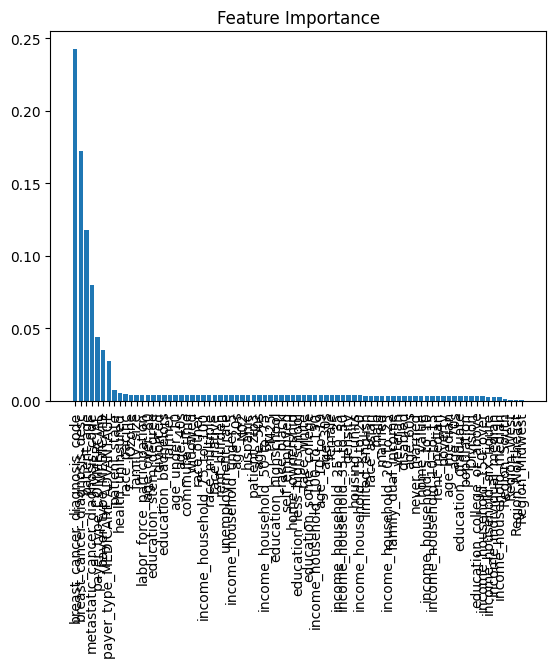

In [ ]:
importances = clf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X.columns[i] for i in indices]

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(X.shape[1]), importances[indices])

# Add feature names as x-axis labels
plt.xticks(range(X.shape[1]), names, rotation=90)

# Show plot
plt.show()

In [ ]:
# Get the names of the top 10 features
top_10_feature_names = [X.columns[i] for i in indices[:25]]

# Print the names of the top 10 features
print("Top 10 features:")
imp_features=[]
for i, feature in enumerate(top_10_feature_names):
    print(f"{i+1}. {feature}")
    imp_features.append(feature)
imp_features

Top 10 features:
1. breast_cancer_diagnosis_code
2. breast_cancer_diagnosis_desc
3. patient_age
4. metastatic_cancer_diagnosis_code
5. payer_type_COMMERCIAL
6. payer_type_MEDICAID
7. payer_type_MEDICARE ADVANTAGE
8. patient_state
9. health_uninsured
10. race_pacific
11. Ozone
12. family_size
13. labor_force_participation
14. age_over_80
15. education_stem_degree
16. divorced
17. education_bachelors
18. farmer
19. age_under_10
20. age_40s
21. commute_time
22. widowed
23. race_other
24. income_household_75_to_100
25. race_multiple


['breast_cancer_diagnosis_code',
 'breast_cancer_diagnosis_desc',
 'patient_age',
 'metastatic_cancer_diagnosis_code',
 'payer_type_COMMERCIAL',
 'payer_type_MEDICAID',
 'payer_type_MEDICARE ADVANTAGE',
 'patient_state',
 'health_uninsured',
 'race_pacific',
 'Ozone',
 'family_size',
 'labor_force_participation',
 'age_over_80',
 'education_stem_degree',
 'divorced',
 'education_bachelors',
 'farmer',
 'age_under_10',
 'age_40s',
 'commute_time',
 'widowed',
 'race_other',
 'income_household_75_to_100',
 'race_multiple']

# **CODE WHICH GAVE 80.7 score**

In [1]:
!pip install optuna
!pip install category_encoders
!pip install catboost
!pip install feature-engine

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import optuna
from category_encoders import OneHotEncoder, MEstimateEncoder, CatBoostEncoder, OrdinalEncoder
from sklearn import set_config
import category_encoders
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer, f1_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, clone
from sklearn.preprocessing import FunctionTransformer,StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.metrics import auc, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier, Pool

In [3]:
sel_col=['patient_age','health_uninsured',
'race_white',
'race_black',
'race_asian',
'race_native',
'race_pacific',
'race_other',
'race_multiple',
'breast_cancer_diagnosis_code',
'breast_cancer_diagnosis_desc',
'metastatic_cancer_diagnosis_code',
'payer_type',
'patient_state']

In [4]:
train = pd.read_csv(r'/content/training.csv', index_col='patient_id')
test = pd.read_csv(r'/content/test.csv', index_col='patient_id')
sub  = pd.read_csv(r'/content/sample_submission.csv')

In [5]:
test = test[sel_col]
label = train['DiagPeriodL90D']
train = pd.concat([train[sel_col],label],axis=1)


In [6]:
def create_stats(dataframe):
  desc = pd.DataFrame(index = list(dataframe))
  desc['type'] = dataframe.dtypes
  desc['count'] = dataframe.count()
  desc['nunique'] = dataframe.nunique()
  desc['%unique'] = desc['nunique'] /len(dataframe) * 100
  desc['null'] = dataframe.isnull().sum()
  desc['%null'] = desc['null'] / len(dataframe) * 100
  desc = pd.concat([desc,dataframe.describe().T.drop('count',axis=1)],axis=1)
  return desc.sort_values(by=['type','null']).style.background_gradient(axis=0)

In [7]:
create_stats(train)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_age,int64,12906,67,0.519138,0,0.000000,59.183326,13.335216,18.000000,50.000000,59.000000,67.000000,91.000000
DiagPeriodL90D,int64,12906,2,0.015497,0,0.000000,0.624516,0.484266,0.000000,0.000000,1.000000,1.000000,1.000000
health_uninsured,float64,12905,727,5.633039,1,0.007748,8.575284,4.203482,2.440000,5.618750,7.465714,10.617442,27.566102
race_white,float64,12905,735,5.695026,1,0.007748,69.718255,17.960882,14.495652,56.757143,70.877966,85.577143,98.443750
race_black,float64,12905,732,5.671781,1,0.007748,11.447491,12.532624,0.060976,2.241860,6.410256,16.218182,69.660000
race_asian,float64,12905,718,5.563304,1,0.007748,5.470315,6.735789,0.000000,1.096491,2.966667,7.066667,49.850000
race_native,float64,12905,655,5.075159,1,0.007748,0.900217,2.499784,0.000000,0.212963,0.430952,0.790000,76.934783
race_pacific,float64,12905,506,3.920657,1,0.007748,0.139318,0.505940,0.000000,0.024138,0.054054,0.146667,14.758442
race_other,float64,12905,713,5.524562,1,0.007748,5.682117,6.252393,0.002564,1.314085,3.513636,7.918182,33.188889
race_multiple,float64,12905,730,5.656284,1,0.007748,6.641799,3.544494,0.433333,3.923077,5.802000,8.850769,26.429870


In [8]:
create_stats(test)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_age,int64,5792,67,1.156768,0,0.000000,59.274862,13.076323,18.000000,50.000000,59.000000,67.000000,91.000000
health_uninsured,float64,5792,672,11.602210,0,0.000000,8.636586,4.142770,2.440000,5.772727,7.468000,10.820000,27.566102
race_white,float64,5792,676,11.671271,0,0.000000,70.082777,17.945750,14.495652,57.224444,70.939130,85.854762,98.443750
race_black,float64,5792,673,11.619475,0,0.000000,11.437775,12.615989,0.096429,2.172222,6.410256,16.269444,69.660000
race_asian,float64,5792,662,11.429558,0,0.000000,5.262948,6.569992,0.000000,0.986957,2.686957,6.638462,49.850000
race_native,float64,5792,615,10.618094,0,0.000000,0.945075,2.681518,0.000000,0.212857,0.430952,0.790000,76.934783
race_pacific,float64,5792,484,8.356354,0,0.000000,0.148971,0.670291,0.000000,0.024138,0.053125,0.146154,14.758442
race_other,float64,5792,661,11.412293,0,0.000000,5.555768,6.142503,0.002564,1.314085,3.510811,7.848214,33.188889
race_multiple,float64,5792,674,11.636740,0,0.000000,6.566156,3.552653,0.706250,3.820000,5.658065,8.850769,26.429870
breast_cancer_diagnosis_code,object,5792,46,0.794199,0,0.000000,nan,nan,nan,nan,nan,nan,nan


In [9]:
values = {"patient_state":"UNKNOWN", "payer_type":"UNKNOWN"}
train = train.fillna(value=values)
test = test.fillna(value=values)

In [10]:
train.shape

(12906, 15)

In [11]:
train = train.dropna()
train.shape

(12905, 15)

In [12]:
create_stats(train)

,type,count,nunique,%unique,null,%null,mean,std,min,25%,50%,75%,max
patient_age,int64,12905,67,0.519179,0,0.000000,59.184735,13.334772,18.000000,50.000000,59.000000,67.000000,91.000000
DiagPeriodL90D,int64,12905,2,0.015498,0,0.000000,0.624564,0.484254,0.000000,0.000000,1.000000,1.000000,1.000000
health_uninsured,float64,12905,727,5.633475,0,0.000000,8.575284,4.203482,2.440000,5.618750,7.465714,10.617442,27.566102
race_white,float64,12905,735,5.695467,0,0.000000,69.718255,17.960882,14.495652,56.757143,70.877966,85.577143,98.443750
race_black,float64,12905,732,5.672220,0,0.000000,11.447491,12.532624,0.060976,2.241860,6.410256,16.218182,69.660000
race_asian,float64,12905,718,5.563735,0,0.000000,5.470315,6.735789,0.000000,1.096491,2.966667,7.066667,49.850000
race_native,float64,12905,655,5.075552,0,0.000000,0.900217,2.499784,0.000000,0.212963,0.430952,0.790000,76.934783
race_pacific,float64,12905,506,3.920961,0,0.000000,0.139318,0.505940,0.000000,0.024138,0.054054,0.146667,14.758442
race_other,float64,12905,713,5.524990,0,0.000000,5.682117,6.252393,0.002564,1.314085,3.513636,7.918182,33.188889
race_multiple,float64,12905,730,5.656722,0,0.000000,6.641799,3.544494,0.433333,3.923077,5.802000,8.850769,26.429870


In [13]:
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)

In [14]:
X.head(10)

,patient_age,health_uninsured,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,payer_type,patient_state
patient_id,,,,,,,,,,,,,,
475714,84,11.200000,44.100000,13.100000,5.100000,1.485714,0.342857,27.114286,8.757143,C50919,Malignant neoplasm of unsp site of unspecified...,C7989,MEDICAID,CA
349367,62,7.018182,54.030303,2.527273,20.827273,0.587879,0.300000,11.645455,10.081818,C50411,Malig neoplm of upper-outer quadrant of right ...,C773,COMMERCIAL,CA
138632,43,15.066667,75.820000,9.231667,3.618333,0.463333,0.146667,3.816667,6.898333,C50112,Malignant neoplasm of central portion of left ...,C773,COMMERCIAL,TX
617843,45,4.404762,65.014286,1.438095,18.845238,0.430952,0.252381,5.428571,8.611905,C50212,Malig neoplasm of upper-inner quadrant of left...,C773,COMMERCIAL,CA
817482,55,12.088000,86.712000,0.426000,0.656000,0.760000,0.108000,5.080000,6.258000,1749,"Malignant neoplasm of breast (female), unspeci...",C773,COMMERCIAL,ID
111545,66,4.797143,93.528571,1.031429,0.422857,0.742857,0.002857,1.000000,3.262857,1749,"Malignant neoplasm of breast (female), unspeci...",C7981,MEDICARE ADVANTAGE,NY
914071,51,10.341538,42.824615,12.216923,12.703077,1.120000,0.146154,22.135385,8.850769,C50912,Malignant neoplasm of unspecified site of left...,C779,COMMERCIAL,CA
479368,60,8.753333,96.406667,0.723333,0.400000,0.146667,0.006667,0.406667,1.913333,C50512,Malig neoplasm of lower-outer quadrant of left...,C773,COMMERCIAL,IL
994014,82,6.645313,84.570769,0.509231,1.835385,2.189231,0.281538,3.115385,7.495385,1744,Malignant neoplasm of upper-outer quadrant of ...,C7800,MEDICARE ADVANTAGE,UNKNOWN


In [23]:
from feature_engine.encoding import OneHotEncoder
ohe = OneHotEncoder(drop_last=True,variables=['payer_type'])
ohe.fit(X)
X=ohe.transform(X)
test=ohe.transform(test)
train=pd.concat([X,y],axis=1)

In [24]:
train.shape

(12905, 17)

In [25]:
test.shape

(5792, 16)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in cat_cols:
    train[col] = le.fit_transform(train[col])
    test[col] = le.fit_transform(test[col])

In [ ]:
train.head(10)

,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,patient_age,metastatic_cancer_diagnosis_code,payer_type,patient_state,health_uninsured,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,
475714,48,42,84,41,1,4,11.200000,44.100000,13.100000,5.100000,1.485714,0.342857,27.114286,8.757143,1
349367,29,12,62,3,0,4,7.018182,54.030303,2.527273,20.827273,0.587879,0.300000,11.645455,10.081818,1
138632,18,23,43,3,0,43,15.066667,75.820000,9.231667,3.618333,0.463333,0.146667,3.816667,6.898333,1
617843,22,4,45,3,0,4,4.404762,65.014286,1.438095,18.845238,0.430952,0.252381,5.428571,8.611905,0
817482,7,18,55,3,0,13,12.088000,86.712000,0.426000,0.656000,0.760000,0.108000,5.080000,6.258000,0
111545,7,18,66,39,2,33,4.797143,93.528571,1.031429,0.422857,0.742857,0.002857,1.000000,3.262857,0
914071,47,44,51,7,0,4,10.341538,42.824615,12.216923,12.703077,1.120000,0.146154,22.135385,8.850769,1
479368,35,2,60,3,0,14,8.753333,96.406667,0.723333,0.400000,0.146667,0.006667,0.406667,1.913333,1
994014,3,48,82,8,2,44,6.645313,84.570769,0.509231,1.835385,2.189231,0.281538,3.115385,7.495385,0


In [15]:
cat_cols = train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = train.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols.remove('DiagPeriodL90D')

In [16]:
num_cols

['patient_age',
 'health_uninsured',
 'race_white',
 'race_black',
 'race_asian',
 'race_native',
 'race_pacific',
 'race_other',
 'race_multiple']

In [17]:
def display_num():
	n_features = len(num_cols)
	n_cols = 6  # The number of columns you want
	n_rows = n_features // n_cols + (n_features % n_cols > 0)  # This will round up the division

	fig, ax = plt.subplots(n_rows, n_cols, figsize=(25,25), dpi=300)
	ax = ax.flatten()
	for i, col in enumerate(num_cols):
		sns.kdeplot(train[col],ax=ax[i],color='b')
		sns.kdeplot(test[col],ax=ax[i],color='g')
		ax[i].set_title(f'{col}')
		ax[i].set_xlabel(None)

	for j in range(len(num_cols),len(ax)):
		ax[j].axis('off')
	fig.suptitle('Distribution of Feature\nper Dataset\n', fontsize = 24, fontweight = 'bold')
	fig.legend(['Train', 'Test'])
	plt.tight_layout(h_pad=0.1, w_pad=0.5)
	plt.show()

def display_col():
	target = 'DiagPeriodL90D'
	fig, ax = plt.subplots(3,4, figsize=(20,20), dpi=300)
	ax = ax.flatten()
	plt.subplots_adjust(wspace=0.3, hspace=0.2)
	for i, col in enumerate(cat_cols):
		sns.countplot(x=train[col],hue=train[target],ax=ax[i])
		ax[i].set_title(f'{col}')
		ax[i].set_xlabel(None)
		ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
	for j in range(len(cat_cols),len(ax)):
		ax[j].axis('off')
	plt.tight_layout(h_pad=0.1)
	plt.show()

In [34]:
display_num()

In [35]:
train['payer_type_MEDICAID_D'] = pd.cut(train['payer_type_MEDICAID'], bins=2, labels=[0, 1])
train['payer_type_COMMERCIAL_D'] = pd.cut(train['payer_type_COMMERCIAL'], bins=2, labels=[0, 1])
train['payer_type_MEDICARE ADVANTAGE_D'] = pd.cut(train['payer_type_MEDICARE ADVANTAGE'], bins=2, labels=[0, 1])

In [36]:
test['payer_type_MEDICAID_D'] = pd.cut(test['payer_type_MEDICAID'], bins=2, labels=[0, 1])
test['payer_type_COMMERCIAL_D'] = pd.cut(test['payer_type_COMMERCIAL'], bins=2, labels=[0, 1])
test['payer_type_MEDICARE ADVANTAGE_D'] = pd.cut(test['payer_type_MEDICARE ADVANTAGE'], bins=2, labels=[0, 1])

In [37]:
train.shape

(12905, 20)

In [38]:
test.shape

(5792, 19)

<ipython-input-17-b9f5c0ce339e>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
<ipython-input-17-b9f5c0ce339e>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
<ipython-input-17-b9f5c0ce339e>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
<ipython-input-17-b9f5c0ce339e>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize='small')
<ipython-input-17-b9f5c0ce339e>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, ha='right',fontsize

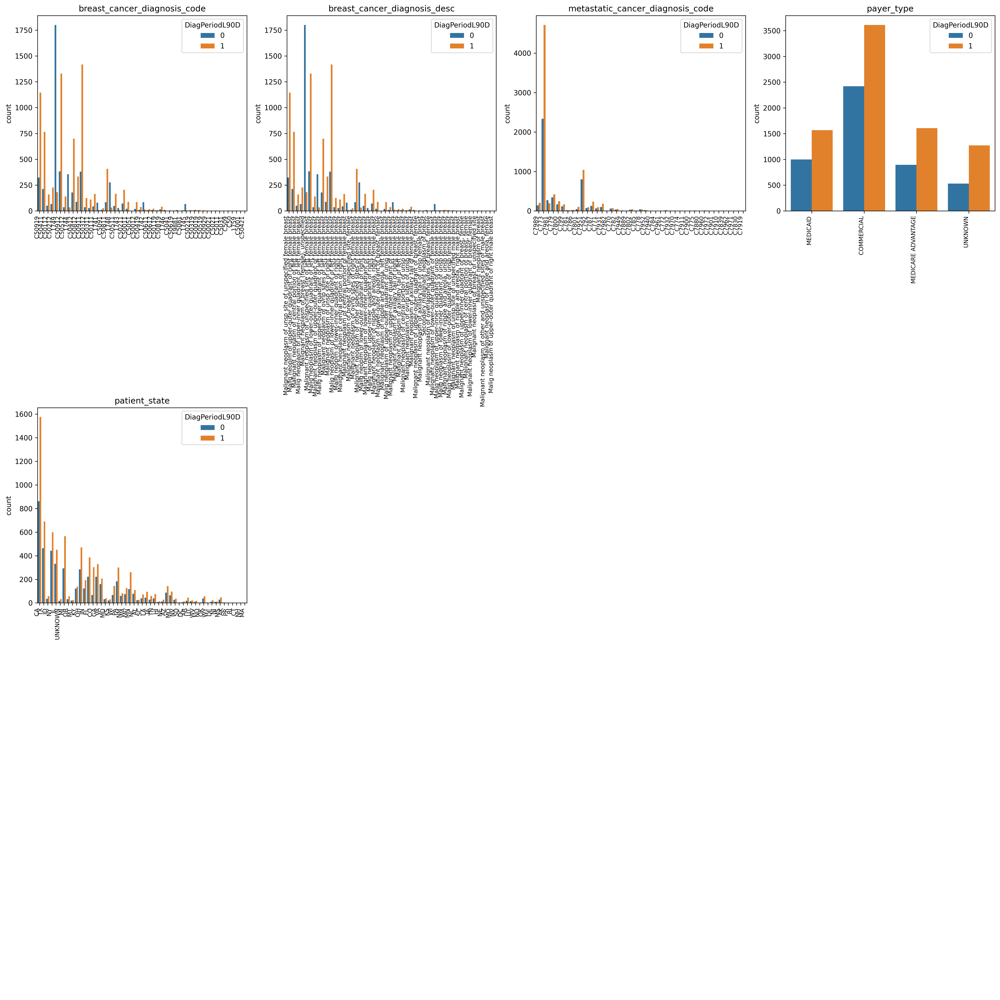

In [18]:
display_col()

In [ ]:
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)
from feature_engine.transformation import LogTransformer
lt = LogTransformer(variables=['patient_age'])
lt.fit(X)
X = lt.transform(X)
test=lt.transform(test)
train=pd.concat([X,y],axis=1)


In [ ]:
display_num()

In [ ]:
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)
from feature_engine.transformation import YeoJohnsonTransformer
yjt = YeoJohnsonTransformer(variables=['health_uninsured','race_white','race_black','race_asian','race_native','race_pacific','race_other','race_multiple','payer_type_MEDICAID','payer_type_COMMERCIAL','payer_type_MEDICARE ADVANTAGE'])
yjt.fit(X)
X = yjt.transform(X)
test=yjt.transform(test)
train=pd.concat([X,y],axis=1)

In [ ]:
train.head()

,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,patient_age,metastatic_cancer_diagnosis_code,patient_state,health_uninsured,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,payer_type_MEDICAID,payer_type_COMMERCIAL,payer_type_MEDICARE ADVANTAGE,DiagPeriodL90D
patient_id,,,,,,,,,,,,,,,,,
475714,C50919,Malignant neoplasm of unsp site of unspecified...,4.430817,C7989,CA,1.669194,221.575604,2.405628,1.401831,0.451817,0.121671,2.337343,2.184967,0.142366,-0.000000,-0.0,1
349367,C50411,Malig neoplm of upper-outer quadrant of right ...,4.127134,C773,CA,1.480216,300.695437,1.204109,2.025644,0.315582,0.117356,1.927352,2.301745,-0.000000,0.573427,-0.0,1
138632,C50112,Malignant neoplasm of central portion of left ...,3.761200,C773,TX,1.778952,501.443966,2.138295,1.231626,0.276860,0.086798,1.321523,1.989885,-0.000000,0.573427,-0.0,1
617843,C50212,Malig neoplasm of upper-inner quadrant of left...,3.806662,C773,CA,1.275570,397.480688,0.862764,1.986722,0.265237,0.110959,1.516857,2.171175,-0.000000,0.573427,-0.0,0
817482,1749,"Malignant neoplasm of breast (female), unspeci...",4.007333,C773,ID,1.698213,614.407122,0.350303,0.468712,0.357027,0.072358,1.480127,1.911418,-0.000000,0.573427,-0.0,0


In [ ]:
display_num()

In [ ]:
target = 'DiagPeriodL90D'
X = train.copy()
y = X.pop(target)
num_cols = train.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols.remove(target)
from feature_engine.wrappers import SklearnTransformerWrapper
from sklearn.preprocessing import StandardScaler
skw = SklearnTransformerWrapper(variables=num_cols, transformer=StandardScaler())
skw.fit(X)
X = skw.transform(X)
test=yjt.transform(test)
train=pd.concat([X,y],axis=1)

In [45]:
cat_cols = train.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = train.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols.remove('DiagPeriodL90D')

In [19]:
class DropColumns(BaseEstimator,TransformerMixin):
    def __init__(self):
        pass

    def fit(self,X,y=None):
        return self

    def transform(self,X,y=None):
        x_copy = X.copy()
        #x_copy = x_copy.drop('bmi',axis=1)
        return x_copy

In [20]:
def ImputeCatCols(d):
    df = d.copy()
    for c in cat_cols:
        df[c] = df[c].fillna('None')
    return df

num_transformer = Pipeline([('imputer',SimpleImputer(strategy='mean')),
                             ('scaler',StandardScaler())])
cat_transformer = Pipeline([('imputer',FunctionTransformer(ImputeCatCols))])

preprocess = ColumnTransformer([('num',num_transformer,num_cols),
                                ('cat',cat_transformer,cat_cols)],
                                remainder='passthrough',
                                verbose_feature_names_out=False).set_output(transform='pandas')
preprocess_catboost= Pipeline([('preprocess',preprocess),
                           ('drop',DropColumns())
                          ])

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_function_transformer.py:343: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


In [21]:
cat_transformer_2= Pipeline([('imputer',SimpleImputer(strategy='most_frequent')),
                           ('cat',CatBoostEncoder())])
num_transformer_2 = Pipeline([('imputer',SimpleImputer(strategy='most_frequent'))])
preprocess_othermodels = ColumnTransformer([('cat',cat_transformer_2,cat_cols),
                                            ('num',num_transformer_2,num_cols)
                                           ])

In [22]:
def score_model(model, label):

    print('model: {}'.format(label))
    X = train.copy()
    y = X.pop(target)

    skf = StratifiedKFold(n_splits=5,random_state=SEED, shuffle=True)

    val_predictions = np.zeros(len(train))
    score_list = []
    for fold, (trx_idx, val_idx) in enumerate(skf.split(X,y)):
        X_train = X.iloc[trx_idx]
        y_train = y.iloc[trx_idx]
        X_val   = X.iloc[val_idx]
        y_val   = y.iloc[val_idx]

        model.fit(X_train,y_train)
        y_pred_train = model.predict_proba(X_train)[:,1]
        y_pred_val   = model.predict_proba(X_val)[:,1]
        auc_train = roc_auc_score(y_train,y_pred_train)
        auc_val   = roc_auc_score(y_val,y_pred_val)

        val_predictions[val_idx] = y_pred_val
        score_list.append(auc_val)
        print(f'fold: {fold} - AUC Train: {auc_train} - AUC Val {auc_val}')

    print(f'AUC MEAN {np.mean(score_list)} - Std: {np.std(score_list)}')

    return score_list, val_predictions

In [34]:
SEED = 42


params_cat = {'learning_rate': 0.0038741132693241795,
              'iterations': 1000,
              'max_depth': 5,
              'subsample': 0.7401131867566202,
              'colsample_bylevel': 0.29684187768021997,
              'min_data_in_leaf': 47,
              'logging_level': 'Silent'}

params_lgb= {'learning_rate': 0.0015880317763720944,
             'subsample': 0.6710494933148675,
             'colsample_bytree': 0.7929648706646588,
             'num_leaves': 29,
             'verbose':-1}
params_lgb = {'learning_rate': 0.001176435844599707,
                'subsample': 0.30836269591938725,
                'colsample_bytree': 0.9876832161025921,
                'num_leaves': 500, 'bagging_freq': 1,
                'min_child_samples': 86,
                'verbose':-1}

params_xbg = {'learning_rate': 0.0010329935862538947,
              'max_depth': 6,
              'subsample': 0.5281085467708261,
              'min_child_weight': 9}

In [33]:
target = 'DiagPeriodL90D'
score_list, oof_list= pd.DataFrame(), pd.DataFrame()
models = [
           ('catBoost',make_pipeline(preprocess_catboost,
                                    CatBoostClassifier(cat_features=cat_cols,
                                                       **params_cat,
                                                       random_state=SEED))),
           ('lgbm',make_pipeline(preprocess_othermodels,
                                 LGBMClassifier(**params_lgb,
                                                random_state=SEED))),

           ('RF',make_pipeline(preprocess_othermodels,
                               RandomForestClassifier(n_estimators=200,
                                                      random_state=SEED,
                                                      min_samples_leaf=92,
                                                      max_features=1.0))),
           ('Extratrees',make_pipeline(preprocess_othermodels,
                                       ExtraTreesClassifier(n_estimators=300,
                                                           random_state=SEED,
                                                           min_samples_leaf=46,
                                                           max_features=1.0))),
           ('XGB',make_pipeline(preprocess_othermodels,
                                 XGBClassifier(**params_xbg,random_state=SEED)))


        ]
for label, model in models:
    score_list[label], oof_list[label] = score_model(model,label)

model: catBoost


CatBoostError: Parameter logging_level should have a type of ((<class 'str'>,),), got <class 'list'>

<Axes: >

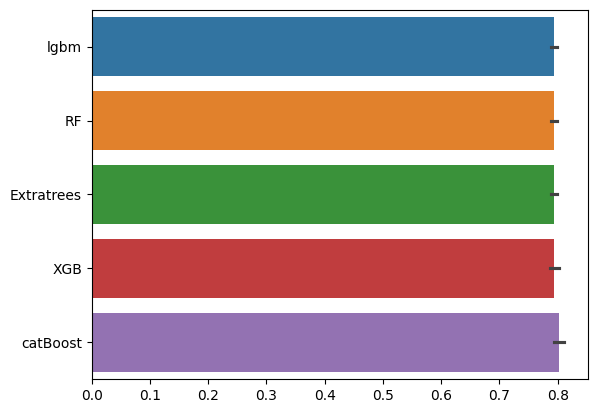

In [25]:
sns.barplot( data=score_list.reindex(score_list.mean().sort_values().index,axis=1),orient='h' )

In [26]:
w = RidgeClassifier().fit(oof_list,train.DiagPeriodL90D).coef_[0]
w

array([ 1.25472227, -0.20901277,  0.63902855,  0.15430437,  0.03027528])

In [27]:
voter = VotingClassifier(models, weights = w, voting = 'soft')

X = train.copy()
y = X.pop('DiagPeriodL90D')

voter.fit(X,y)

VotingClassifier(estimators=[('catBoost',
                              Pipeline(steps=[('pipeline',
                                               Pipeline(steps=[('preprocess',
                                                                ColumnTransformer(remainder='passthrough',
                                                                                  transformers=[('num',
                                                                                                 Pipeline(steps=[('imputer',
                                                                                                                  SimpleImputer()),
                                                                                                                 ('scaler',
                                                                                                                  StandardScaler())]),
                                                                                                 ['patient_age',
                                                                                                  'health_uninsured',
                                                                                                  'race_white',
                                                                                                  'race_black',
                                                                                                  'race_asian',
                                                                                                  'race_native',
                                                                                                  'race_pacific',
                                                                                                  'race_other'...
                                                             max_bin=None,
                                                             max_cat_threshold=None,
                                                             max_cat_to_onehot=None,
                                                             max_delta_step=None,
                                                             max_depth=6,
                                                             max_leaves=None,
                                                             min_child_weight=9,
                                                             missing=nan,
                                                             monotone_constraints=None,
                                                             multi_strategy=None,
                                                             n_estimators=None,
                                                             n_jobs=None,
                                                             num_parallel_tree=None,
                                                             random_state=42, ...))]))],
                 voting='soft',
                 weights=array([ 1.25472227, -0.20901277,  0.63902855,  0.15430437,  0.03027528]))

In [28]:
def submit_result(voter,test):
    sub  = pd.read_csv(r'/content/sample_submission.csv')
    sub["DiagPeriodL90D"] = voter.predict_proba(test)[:, 1]
    filename='submission.csv'
    sub.to_csv(filename,index=False)

In [29]:
submit_result(voter,test)

In [ ]:
#for label, model in models:
#    submit_result(model,test,label)